Представлены данные об оттоке клиентов некоторого банка. Банк хочет разработать кампанию лояльности по удержанию клиентов, для этого ему необходимо выяснить основные причины оттока клиентов, установить, чем ушедшие клиенты отличаются от лояльных и как между собой связаны различные признаки, определяющие клиентов.

После разведывательного анализа, с целью выявления наиболее важных признаков оттока, банк сможет построить модель машинного обучения, которая будет прогнозировать уход клиента. 

    → Необходимо подготовить мини-отчёт о проделанной работе в виде ноутбука, в котором содержатся ответы в виде графика и подробных выводов.
    → Для визуализации вы можете использовать любую из изученных библиотек.
    → Перед выполнением задания обязательно подумайте, какие признаки в данных являются числовыми, а какие — категориальными. Это поможет вам построить правильный график (ещё раз взгляните на схему выбора графика).
    → При выполнении заданий обязательно придерживайтесь критериев правильной визуализации, приведённых в юните «Искусство визуализации».

В качестве ответа вставьте в форму ниже ссылку на ноутбук или сам файл в формате IPYNB.

    → В файле должно содержаться 10 графиков — 10 ответов к заданиям.
    → Каждый график и преобразования к нему выполняются в отдельной ячейке.
    → Под графиком вы должны предоставить свой ответ на вопрос по нему и, если это требуется, выводы, которые вы можете сделать, исходя из графика.

Столбцы таблицы:

    CustomerId — идентификатор клиента
    Surname — фамилия клиента
    CreditScore — кредитный рейтинг клиента (чем он выше, тем больше клиент брал кредитов и возвращал их)
    Geography — страна клиента (банк международный)
    Gender — пол клиента
    Age — возраст клиента
    Tenure — сколько лет клиент пользуется услугами банка
    Balance — баланс на счетах клиента в банке
    NumOfProducts — количество услуг банка, которые приобрёл клиент
    HasCrCard — есть ли у клиента кредитная карта (1 — да, 0 — нет)
    IsActiveMember — есть ли у клиента статус активного клиента банка (1 — да, 0 — нет)
    EstimatedSalary — предполагаемая заработная плата клиента
    Exited — статус лояльности (1 — ушедший клиент, 0 — лояльный клиент)

In [44]:
import pandas as pd

import matplotlib.pyplot as plt
plt.style.use('default')

import seaborn as sns

import plotly
import plotly.express as px

churn_data = pd.read_csv('D:\IDE\data\examen\Python 13 final.bank/churn.csv', sep=',')
# churn_data = churn_data.drop(['RowNumber'], axis=1) # удаляется признак RowNumber
display(churn_data.head())

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


9.1. Каково соотношение ушедших и лояльных клиентов? Покажите это на графике и дайте комментарий по соотношению.

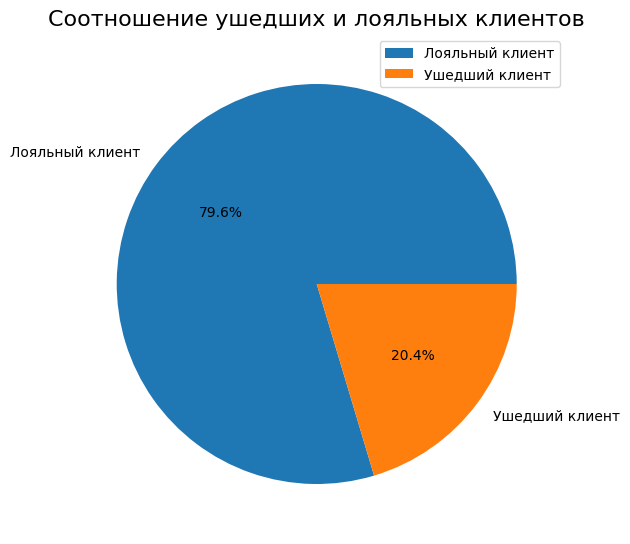

In [73]:
def loyal(z):
    if z == 0:
        return 'Лояльный клиент'
    else:
        return 'Ушедший клиент'
churn_data['Loyal'] = churn_data['Exited'].apply(loyal) # признак лояльности клиента

ratio_customer = churn_data['Loyal'].value_counts()
fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    ratio_customer,
    labels=ratio_customer.index,
    autopct='%.1f%%',
    explode = [0, 0]
);

axes.set_title('Соотношение ушедших и лояльных клиентов', fontsize=16)
axes.legend();

Основная часть клиентов (79,6%) продолжает сотрудничать с банком. Тем не менее, банк теряет каждого пятого клиента.

9.2. Постройте график, показывающий распределение баланса пользователей, у которых на счету больше 2 500 долларов. Опишите распределение и сделайте выводы.

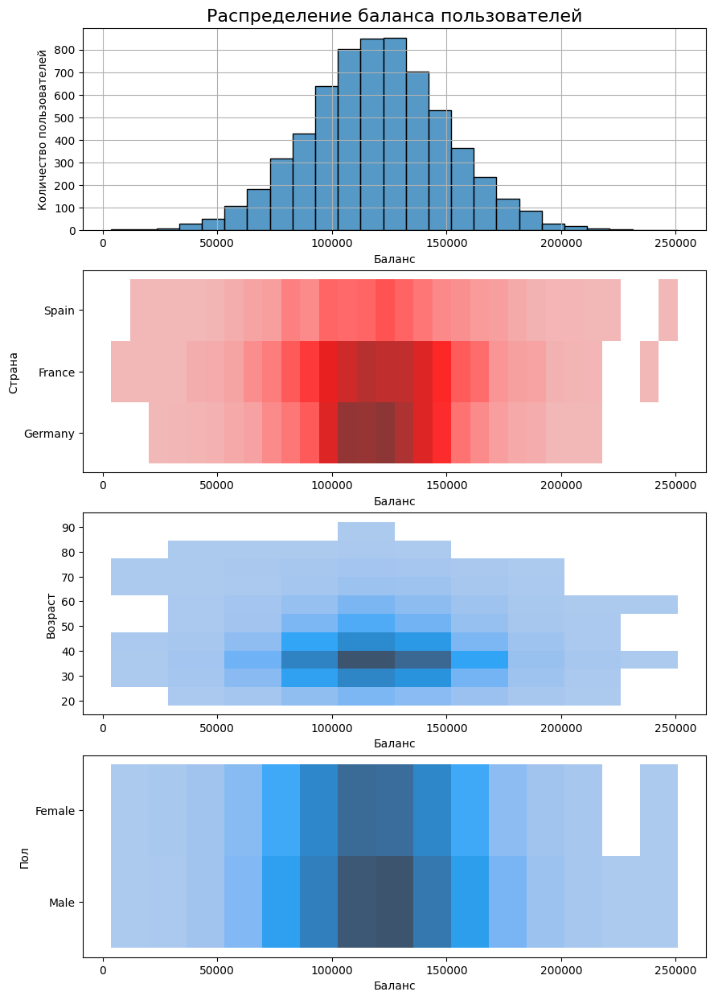

In [76]:
mask1 = churn_data['Balance'] > 2500
customer2500 = churn_data[mask1] # новая таблица пользователей с балансом больше 2500 долларов

fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(10, 15))

sns.histplot(
    data=customer2500,
    x='Balance',
    bins=25,
    ax=axes[0]
)
axes[0].set_title('Распределение баланса пользователей', fontsize=16)
axes[0].set_ylabel('Количество пользователей')
axes[0].set_xlabel('Баланс');
axes[0].grid()
                  
sns.histplot(
    data=customer2500,
    x='Balance',
    y='Geography',
    bins=30,
    color='red',
    ax=axes[1]
)
axes[1].set_ylabel('Страна')
axes[1].set_xlabel('Баланс')

sns.histplot(
    data=customer2500,
    x='Balance',
    y='Age',
    bins=10,
    ax=axes[2]
)
axes[2].set_ylabel('Возраст')
axes[2].set_xlabel('Баланс')

sns.histplot(
    data=customer2500,
    x='Balance',
    y='Gender',
    bins=15,
    ax=axes[3]
)
axes[3].set_ylabel('Пол')
axes[3].set_xlabel('Баланс');

Вклады клиентов составляют от 50 000 до 200 000 долларов. Максимальное значение - 250 000 долларов (Испания). В основном, большая часть вкладов - от 80 000 до 150 000 долларов. Основная часть таких вкладчиков находится в Германии, меньше всего - в Испании. Основной возраст вкладчиков - от 25 до 60 лет. Пол клиента на сумму вклада большого влияния не имеет.

9.3. Посмотрите на распределение баланса клиента в разрезе признака оттока. Как различаются суммы на накопительном счёте ушедших и лояльных клиентов? Подумайте и напишите, с чем это может быть связано, что может не устраивать ушедших клиентов в банке.

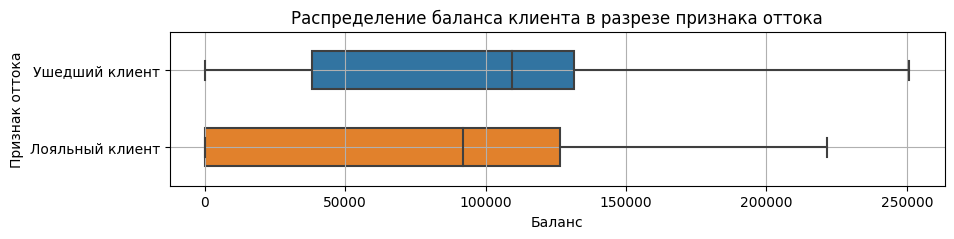

In [47]:
fig = plt.figure(figsize=(10, 2))
boxplot = sns.boxplot(
    data=churn_data,
    y='Loyal',
    x='Balance',
    orient='h',
    width=0.5
)
boxplot.set_title('Распределение баланса клиента в разрезе признака оттока');
boxplot.set_xlabel('Баланс');
boxplot.set_ylabel('Признак оттока');
boxplot.grid()

Суммы на накопительном счете ушедших клиентов в среднем выше, чем у лояльных (медиана больше). Ушедшие клиенты также склонны были делать сумму вклада выше, чем у лояльных клиентов. 

9.4. Посмотрите на распределение возраста в разрезе признака оттока. В какой группе больше потенциальных выбросов? На какую возрастную категорию клиентов стоит обратить внимание банку?

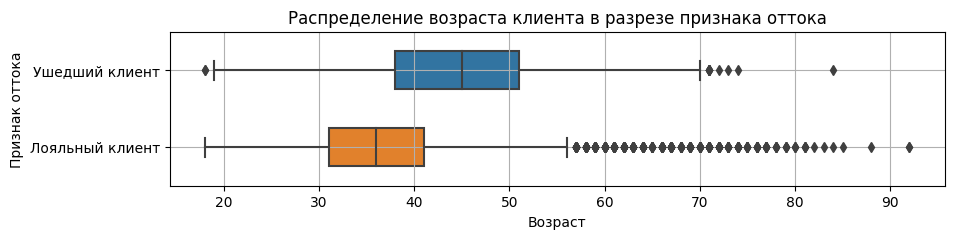

In [48]:
fig = plt.figure(figsize=(10, 2))
boxplot = sns.boxplot(
    data=churn_data,
    y='Loyal',
    x='Age',
    orient='h',
    width=0.5
)
boxplot.set_title('Распределение возраста клиента в разрезе признака оттока');
boxplot.set_xlabel('Возраст');
boxplot.set_ylabel('Признак оттока');
boxplot.grid()

В группе лояльных клиентов большое количество потенциальных выбросов. Лояльные клиенты имеют возраст в основном от 31 до 41 года, среднее значение 36 лет. Возраст ушедших клиентов в основном от 38 до 51 года, среднее значение 46 лет. На данную возрастную категорию стоит обратить внимание банка.

9.5. Постройте график, который показывает взаимосвязь кредитного рейтинга клиента и его предполагаемой зарплаты. Добавьте расцветку по признаку оттока клиентов. Какова взаимосвязь между признаками? Если не видите явной взаимосвязи, укажите это.

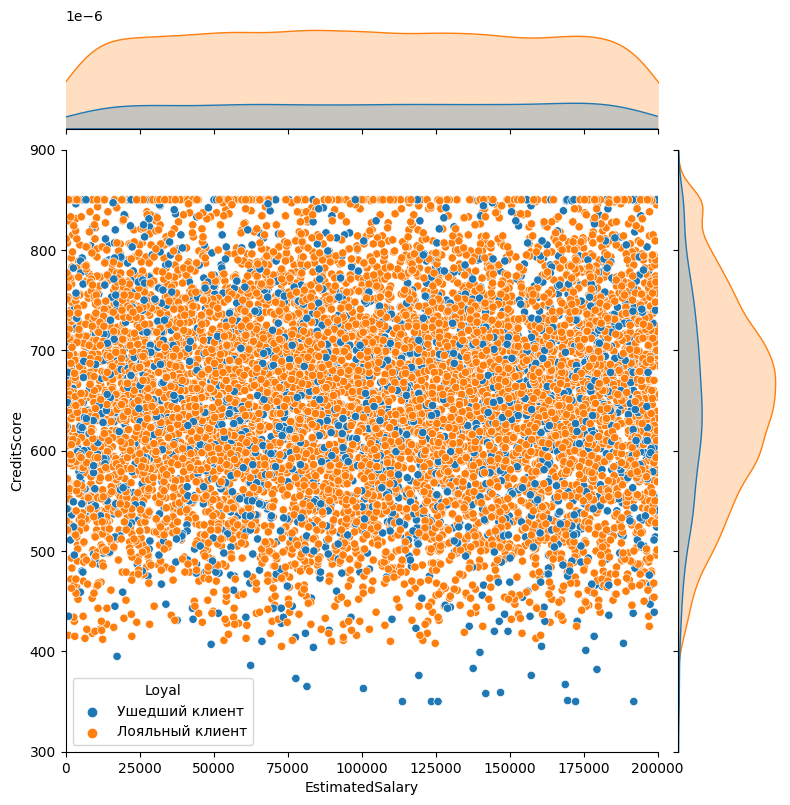

In [49]:
jointplot = sns.jointplot(
    data=churn_data, 
    x='EstimatedSalary', 
    y='CreditScore',
    hue='Loyal',
    xlim = (0, 200000),
    ylim = (300, 900),
    height=8,
)

Взаимосвязь между кредитным рейтингом и зарплатой клиента не прослеживается. Также эта взаимосвязь не влияет на признак лояльности.

9.6. Кто чаще уходит, мужчины или женщины? Постройте график, который иллюстрирует это.
Подсказка
Процент ушедших клиентов в каждой группе можно рассчитать как среднее по столбцу Exited (так как 1 — это ушедшие клиенты, а 0 — лояльные, среднее арифметическое по столбцу обозначает долю ушедших клиентов).

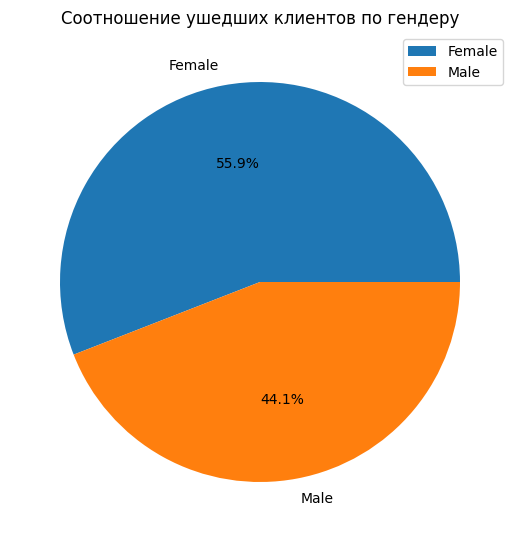

In [50]:
mask2 = churn_data['Exited'] == 1
exite = churn_data[mask2].groupby(['Gender'])['Exited'].count()

fig = plt.figure(figsize=(5, 5))
axes = fig.add_axes([0, 0, 1, 1])
axes.pie(
    exite,
    labels=exite.index,
    autopct='%.1f%%',
    explode = [0, 0]
);

axes.set_title('Соотношение ушедших клиентов по гендеру', fontsize=12)
axes.legend();

Основную часть ушедших клиентов составляют женщины. Однако доля ушедших клиентов-женщин не является подавляющей.

9.7. Как отток клиентов зависит от числа приобретённых у банка услуг? Для ответа на этот вопрос постройте многоуровневую столбчатую диаграмму.

In [58]:
bar_data = churn_data.groupby(['NumOfProducts', 'Exited'], as_index=False).count()
fig = px.bar(
    data_frame=bar_data,
    x='NumOfProducts',
    y='RowNumber',
    color='Exited',
    barmode='group',
    height=500,
    width=800,
    title='Соотношение ушедших и лояльных клиентов в зависимости от числа услуг'
)
fig.show(renderer='notebook')

Лояльные клиенты пользуются как правило 1 - 2-мя услугами. Совсем маленький процент из них пользовался тремя, четыре услуги никто не использовал. В отличие от лояльных, ушедшие пользовались, как правило, одной услугой, реже 2-мя, еще реже 3-мя  и 4-мя.

9.8. Как влияет наличие статуса активного клиента на отток клиентов? Постройте диаграмму, иллюстрирующую это. Что бы вы предложили банку, чтобы уменьшить отток клиентов среди неактивных?

In [60]:
def active(z2):
    if z2 == 1:
        return 'Активный клиент'
    else:
        return 'Неактивный клиент'
churn_data['Active'] = churn_data['IsActiveMember'].apply(active) # признак активности клиента

fig = px.sunburst(
    churn_data,
    path=['Active', 'Loyal'],
    width=500,
    height=500
)
fig.update_traces(textinfo="label+percent entry")
fig.show(renderer='notebook')

C:\Users\dom\AppData\Local\Programs\Python\Python38\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\dom\AppData\Local\Programs\Python\Python38\lib\site-packages\plotly\express\_core.py:1637: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Среди активных клиентов доля оттока клиентов ниже, чем среди неактивных, практически в 2 раза. В то же время, количество активных и неактивных клиентов фактически одинаково и различается незначительно. Для уменьшения оттока неактивных клиентов возможно предложение им продуктов банка, которые могли бы их заинтересовать, перевести в категорию активных клиентов.

9.9. В какой стране доля ушедших клиентов больше? Постройте тепловую картограмму, которая покажет это соотношение на карте мира. Предположите, с чем это может быть связано.

In [70]:
chor_data = churn_data.groupby(['Geography'], as_index=False).mean()
fig = px.choropleth(
    data_frame=chor_data,
    locations='Geography',
    locationmode='country names',
    color='Exited',
    hover_name='Geography',
    color_continuous_scale='Reds',
    height=500,
    width=700,
    title='Отток клиентов на карте мира',
)
fig.show(renderer='notebook')

Exited,0,1
Geography,,
France,4204,810
Germany,1695,814
Spain,2064,413


Text(0.5, 1.0, 'Тепловая карта ушедших клиентов по странам')

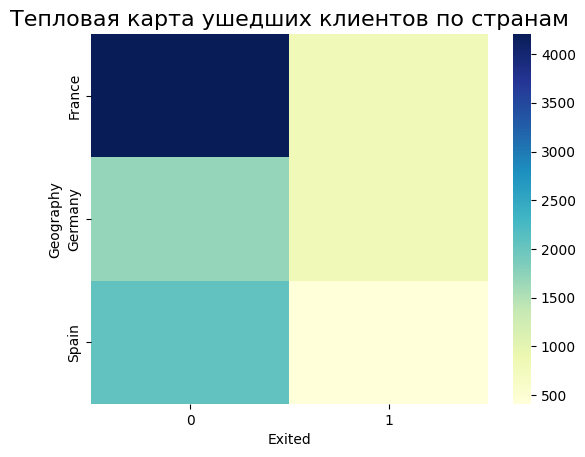

In [72]:
pivot = churn_data.pivot_table(
    values='RowNumber',
    columns='Exited',
    index='Geography',
    aggfunc='count',
)
pivot.columns = pivot.columns.astype('string')
display(pivot)

heatmap = sns.heatmap(data=pivot, cmap='YlGnBu')
heatmap.set_title('Тепловая карта ушедших клиентов по странам', fontsize=16)

Доля ушедших клиентов больше в Германии. Возможно это связано с недостаточным географическим присутствием банка в данном регионе



9.10. Переведите числовой признак CreditScore в категориальный. Для этого воспользуйтесь функцией get_credit_score_cat(), которая приведена ниже. Примените её к столбцу CreditScore и создайте новый признак CreditScoreCat — категории кредитного рейтинга.

def get_credit_score_cat(credit_score):
    if credit_score >= 300 and credit_score < 500:
        return "Very_Poor"
    elif credit_score >= 500 and credit_score < 601:
        return "Poor"
    elif credit_score >= 601 and credit_score < 661:
        return "Fair"
    elif credit_score >= 661 and credit_score < 781:
        return "Good"
    elif credit_score >= 781 and credit_score < 851:
        return "Excellent"
    elif credit_score >= 851:
        return "Top"
    elif credit_score < 300:
        return "Deep"
        
Постройте сводную таблицу, строками которой являются категории кредитного рейтинга (CreditScoreCat), а столбцами — количество лет, в течение которых клиент пользуется услугами банка (Tenure). В ячейках сводной таблицы должно находиться среднее по признаку оттока (Exited) — доля ушедших пользователей.

На основе полученной сводной таблицы постройте тепловую карту с аннотацией. Найдите на тепловой карте категории клиентов, которые уходят чаще всего.

Tenure,0,1,2,3,4,5,6,7,8,9,10
CreditScoreCat,,,,,,,,,,,
Excellent,0.275000,0.208333,0.137255,0.168317,0.131868,0.233333,0.241379,0.127660,0.196078,0.270833,0.254902
Fair,0.217391,0.215596,0.213043,0.216450,0.197248,0.206897,0.236364,0.171103,0.209016,0.190045,0.205357
Good,0.203822,0.203608,0.187342,0.205962,0.195122,0.214470,0.182857,0.191892,0.152355,0.194667,0.197802
Poor,0.226415,0.259398,0.211765,0.212245,0.233202,0.199153,0.179916,0.151261,0.214575,0.251082,0.169492
Very_Poor,0.444444,0.253731,0.151515,0.285714,0.293103,0.149254,0.225352,0.206349,0.253521,0.229508,0.333333


Text(0.5, 1.0, 'Тепловая карта кредитного рейтинга')

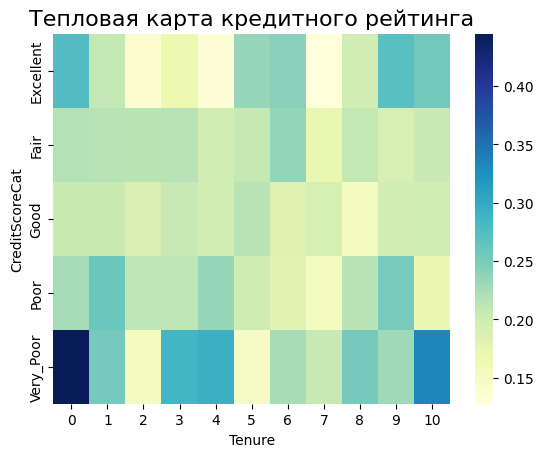

In [42]:
def get_credit_score_cat(credit_score):
    if credit_score >= 300 and credit_score < 500:
        return "Very_Poor"
    elif credit_score >= 500 and credit_score < 601:
        return "Poor"
    elif credit_score >= 601 and credit_score < 661:
        return "Fair"
    elif credit_score >= 661 and credit_score < 781:
        return "Good"
    elif credit_score >= 781 and credit_score < 851:
        return "Excellent"
    elif credit_score >= 851:
        return "Top"
    elif credit_score < 300:
        return "Deep"

churn_data['CreditScoreCat'] = churn_data['CreditScore'].apply(get_credit_score_cat) # 

pivot2 = churn_data.pivot_table(
    values='Exited',
    columns='Tenure',
    index='CreditScoreCat',
    aggfunc='mean',
)
pivot.columns = pivot.columns.astype('string')
display(pivot2)

heatmap2 = sns.heatmap(data=pivot2, cmap='YlGnBu')
heatmap2.set_title('Тепловая карта кредитного рейтинга', fontsize=16)

Чаще всего склонны к уходу клиенты категории "Very_Poor", особенно на первом году пользования услугами банка. Также высок отток таких клиентов на 10 году пользования услугами.
Самыми стабильно лояльными клиентами являются клиенты категорий "Fair" и "Good". 
Среди клиентов категории "Excellent" чаще попадаются самые лояльные клиенты (на 3, 5 и 8 году), но их поведение нестабильно. На 1, 9 и 10 году они больше склонны к уходу. Возможно это связано с какаим-либо банковским продуктом.